# Capstone 2: Data wrangling

# Imports

In [2]:
#Import pandas, matplotlib.pyplot, and seaborn in the correct lines below
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import pandas_profiling
import lazypredict

from library.sb_utils import save_file

## Load The Data

In [3]:
# the supplied CSV data file is the raw_data directory
clar_eff = pd.read_csv('./data/clar_eff_by_batch.txt')
clar_eff = clar_eff[clar_eff['clar_eff'] < 100]
clar_eff = clar_eff[clar_eff['clar_eff'] > 50]
rcp_malt = pd.read_csv('./data/rcp_malt.txt')
rcp_additives = pd.read_csv('./data/rcp_additives.txt')

In [4]:
clar_eff.info()
rcp_malt.info()
rcp_additives.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1123 entries, 0 to 1332
Data columns (total 12 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   rcp_id                 1123 non-null   int64  
 1   fermenter_temperature  1106 non-null   float64
 2   cu_low                 1068 non-null   float64
 3   cu_high                1102 non-null   float64
 4   cu_setpoint            1115 non-null   float64
 5   pre_run_dump_volume    557 non-null    float64
 6   time_start             1114 non-null   object 
 7   time_end               1110 non-null   object 
 8   original_gravity       1123 non-null   float64
 9   fermenter_volume       1123 non-null   float64
 10  brite_volume           1123 non-null   float64
 11  clar_eff               1123 non-null   float64
dtypes: float64(9), int64(1), object(2)
memory usage: 114.1+ KB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 299 entries, 0 to 298
Data columns (total 4 columns

In [5]:
rcp_additives_pivot = rcp_additives[rcp_additives['add_type']=='Hops'][['recipe_id','location','add_per_bbl']].pivot(index='recipe_id', columns='location', values='add_per_bbl')[['Boil Kettle','Whirlpool','Fermenter']].reset_index()
rcp_additives_pivot = rcp_additives_pivot[~(rcp_additives_pivot['Boil Kettle'].isna() & rcp_additives_pivot['Whirlpool'].isna() & rcp_additives_pivot['Fermenter'].isna())]
rcp_additives_pivot.columns.name = ''
rcp_additives_pivot = rcp_additives_pivot.fillna(value=0)
rcp_additives_pivot['Total Hops'] = rcp_additives_pivot['Boil Kettle'] + rcp_additives_pivot['Whirlpool'] + rcp_additives_pivot['Fermenter']
print(rcp_additives_pivot)
print(rcp_additives_pivot.shape)

     recipe_id  Boil Kettle  Whirlpool  Fermenter  Total Hops
0           75    11.548269   0.915385   2.369231   14.832885
1           76     6.742129   0.179722   1.198148    8.120000
3           87     2.832110   0.478899   0.582569    3.893578
4           89     1.978261   0.118261   0.000000    2.096522
5           92     2.694340   0.160377   0.000000    2.854717
..         ...          ...        ...        ...         ...
196        417     4.233333   0.933333   1.600000    6.766667
204        425     1.328125   0.000000   0.000000    1.328125
209        432     1.624242   0.484848   0.000000    2.109091
210        434     1.000000   0.266667   0.000000    1.266667
211        435     0.062500   0.562500   1.125000    1.750000

[106 rows x 5 columns]
(106, 5)


In [6]:
clar_eff_and_malt = pd.merge(clar_eff, rcp_malt[['rcp_id','base_malt_pct']], on='rcp_id', how = 'outer')
clar_eff_and_malt_and_hops = pd.merge(clar_eff_and_malt, rcp_additives_pivot, left_on='rcp_id', right_on='recipe_id', how = 'outer')[['rcp_id','base_malt_pct','Boil Kettle','Whirlpool','Fermenter','Total Hops','fermenter_temperature','cu_low','cu_high','cu_setpoint','pre_run_dump_volume','original_gravity','clar_eff']]
clar_eff_and_malt_and_hops['rcp_id'] = clar_eff_and_malt_and_hops['rcp_id'].astype('str')
clar_eff_and_malt_and_hops = clar_eff_and_malt_and_hops[~clar_eff_and_malt_and_hops['clar_eff'].isnull()]

# save the data to a new csv file
datapath = './data'
save_file(clar_eff_and_malt_and_hops, 'batch_data_clean.csv', datapath)

print(clar_eff_and_malt_and_hops.head())
print(clar_eff_and_malt_and_hops.shape)

A file already exists with this name.

Writing file.  "./data\batch_data_clean.csv"
  rcp_id  base_malt_pct  Boil Kettle  Whirlpool  Fermenter  Total Hops  \
0    102      79.104477     7.944444   0.435185   1.196296    9.575926   
1    102      79.104477     7.944444   0.435185   1.196296    9.575926   
2    102      79.104477     7.944444   0.435185   1.196296    9.575926   
3    102      79.104477     7.944444   0.435185   1.196296    9.575926   
4    102      79.104477     7.944444   0.435185   1.196296    9.575926   

   fermenter_temperature  cu_low  cu_high  cu_setpoint  pre_run_dump_volume  \
0                   33.0    0.40     0.70          0.4                  NaN   
1                   33.0    0.40     0.70          0.4                  NaN   
2                   36.0    0.15     0.25          0.4                  NaN   
3                   36.0    0.30     0.80          0.8                  NaN   
4                   33.2    0.24     0.80          8.0                  NaN 

In [13]:
rcp_malt_and_hops = pd.merge(rcp_malt[['rcp_id','base_malt_pct']], rcp_additives_pivot, left_on = 'rcp_id', right_on = 'recipe_id', how = 'outer')
rcp_malt_and_hops_mean_all = pd.merge(rcp_malt_and_hops, clar_eff.groupby('rcp_id')[['fermenter_temperature','cu_low','cu_high','cu_setpoint','pre_run_dump_volume','original_gravity','clar_eff']].mean().reset_index(), on = 'rcp_id', how = 'outer')[['rcp_id','base_malt_pct','Boil Kettle','Whirlpool','Fermenter','Total Hops','fermenter_temperature','cu_low','cu_high','cu_setpoint','pre_run_dump_volume','original_gravity','clar_eff']]
rcp_malt_and_hops_mean_all = rcp_malt_and_hops_mean_all[~rcp_malt_and_hops_mean_all['clar_eff'].isnull()]

# save the data to a new csv file
datapath = './data'
save_file(rcp_malt_and_hops_mean_all, 'recipe_data_clean.csv', datapath)

print(rcp_malt_and_hops_mean_all.head())
print(rcp_malt_and_hops_mean_all.shape)

A file already exists with this name.

Writing file.  "./data\recipe_data_clean.csv"
   rcp_id  base_malt_pct  Boil Kettle  Whirlpool  Fermenter  Total Hops  \
0      75      81.935483    11.548269   0.915385   2.369231   14.832885   
1      76      73.452258     6.742129   0.179722   1.198148    8.120000   
2      78      86.021507          NaN        NaN        NaN         NaN   
3      87      67.502022     2.832110   0.478899   0.582569    3.893578   
4      89      70.038909     1.978261   0.118261   0.000000    2.096522   

   fermenter_temperature    cu_low   cu_high  cu_setpoint  \
0              34.160000  0.154667  0.439333     0.655000   
1              34.433333  0.257778  0.491111     0.661111   
2              33.037209  0.271429  0.454545     0.640909   
3              33.528868  0.185625  0.371538     0.523585   
4              37.000000  0.260000  0.433333     0.566667   

   pre_run_dump_volume  original_gravity   clar_eff  
0             1.480000         15.804333  8

In [179]:
clar_eff_and_malt_and_hops.profile_report(sort='None', html={'style':{'full_width': True}}, progress_bar=False)

In [180]:
rcp_malt_and_hops_mean_all.profile_report(sort='None', html={'style':{'full_width': True}}, progress_bar=False)

## Explore The Data

### Number Of Missing Values By Column

In [8]:
# Missing value counts
missing = pd.concat([clar_eff_and_malt_and_hops.isnull().sum(), 100 * clar_eff_and_malt_and_hops.isnull().mean()], axis=1)
missing.columns=['count', '%']
missing.sort_values(by='%',ascending=False)

,count,%
pre_run_dump_volume,566,50.400712
Boil Kettle,289,25.734639
Whirlpool,289,25.734639
Fermenter,289,25.734639
Total Hops,289,25.734639
cu_low,55,4.897596
cu_high,21,1.869991
fermenter_temperature,17,1.513802
cu_setpoint,8,0.712378
base_malt_pct,1,0.089047


In [9]:
# Missing value counts
missing = pd.concat([rcp_malt_and_hops_mean_all.isnull().sum(), 100 * rcp_malt_and_hops_mean_all.isnull().mean()], axis=1)
missing.columns=['count', '%']
missing.sort_values(by='%',ascending=False)

,count,%
Boil Kettle,171,63.333333
Whirlpool,171,63.333333
Fermenter,171,63.333333
Total Hops,171,63.333333
pre_run_dump_volume,114,42.222222
cu_low,10,3.703704
cu_high,7,2.592593
cu_setpoint,6,2.222222
fermenter_temperature,3,1.111111
base_malt_pct,1,0.370370


In [11]:
multi_values = clar_eff_and_malt_and_hops['rcp_id'].value_counts() > 5
multi_values_true = pd.DataFrame(multi_values[multi_values == True])
multi_values_true = multi_values_true.reset_index(drop=False)
box_data = clar_eff_and_malt_and_hops.merge(multi_values_true, left_on='rcp_id', right_on='index')
box_data['Hop Categories'] = pd.cut(box_data['Total Hops'],bins=[0,2,6,10,60],labels=['0 - 2 lbs/BBL','2 - 6 lbs/BBL','6-10 lbs/BBL','>10 lbs/BBL'])
box_data.head()

,rcp_id_x,base_malt_pct,Boil Kettle,Whirlpool,Fermenter,Total Hops,fermenter_temperature,cu_low,cu_high,cu_setpoint,pre_run_dump_volume,original_gravity,clar_eff,index,rcp_id_y,Hop Categories
0,102,79.104477,7.944444,0.435185,1.196296,9.575926,33.0,0.40,0.70,0.4,NaN,14.38,90.209426,102,True,6-10 lbs/BBL
1,102,79.104477,7.944444,0.435185,1.196296,9.575926,33.0,0.40,0.70,0.4,NaN,14.38,90.209426,102,True,6-10 lbs/BBL
2,102,79.104477,7.944444,0.435185,1.196296,9.575926,36.0,0.15,0.25,0.4,NaN,14.55,87.540528,102,True,6-10 lbs/BBL
3,102,79.104477,7.944444,0.435185,1.196296,9.575926,36.0,0.30,0.80,0.8,NaN,14.38,86.248203,102,True,6-10 lbs/BBL
4,102,79.104477,7.944444,0.435185,1.196296,9.575926,33.2,0.24,0.80,8.0,NaN,14.30,89.827430,102,True,6-10 lbs/BBL


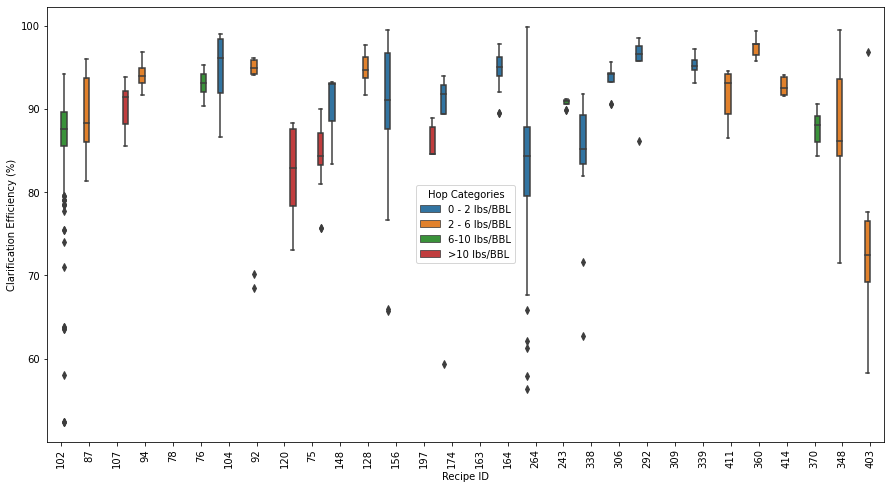

In [12]:
plt.subplots(figsize=(15, 8))
sns.boxplot(x='rcp_id_x', y='clar_eff', hue = 'Hop Categories', data=box_data)
plt.xticks(rotation='vertical')
plt.ylabel('Clarification Efficiency (%)')
plt.xlabel('Recipe ID');

In [183]:
clar_eff_and_malt_and_hops.describe().T

,count,mean,std,min,25%,50%,75%,max
base_malt_pct,1122.0,72.200990,13.072988,30.000001,65.445024,75.904191,79.104477,100.000000
Boil Kettle,834.0,5.575223,5.707676,0.000000,1.409455,4.875000,7.944444,53.987874
Whirlpool,834.0,0.418419,0.357480,0.000000,0.235294,0.435185,0.487500,5.161290
Fermenter,834.0,0.864859,0.751334,0.000000,0.000000,1.196296,1.196296,3.529412
Total Hops,834.0,6.858500,6.232808,0.400000,1.929091,6.205882,9.575926,54.472723
fermenter_temperature,1106.0,33.303571,2.777863,24.100000,31.799999,33.000000,34.500000,62.200001
cu_low,1068.0,0.257510,0.255604,0.000000,0.080000,0.180000,0.350000,2.550000
cu_high,1102.0,0.454757,0.386206,0.000000,0.180000,0.390000,0.607500,3.000000
cu_setpoint,1115.0,0.650278,0.446227,0.050000,0.400000,0.500000,0.800000,8.000000
pre_run_dump_volume,557.0,5.031867,5.251054,0.000000,0.900000,2.400000,8.000000,30.500000


In [181]:
rcp_malt_and_hops_mean_all.describe().T

,count,mean,std,min,25%,50%,75%,max
base_malt_pct,269.0,68.654454,14.643636,30.000001,57.877815,69.230771,78.947371,100.000000
Boil Kettle,99.0,5.567253,8.958677,0.000000,1.140584,2.507927,5.866518,53.987874
Whirlpool,99.0,0.477426,0.609364,0.000000,0.128624,0.391765,0.640303,5.161290
Fermenter,99.0,0.813658,0.915167,0.000000,0.000000,0.588235,1.477273,3.529412
Total Hops,99.0,6.858337,9.288246,0.400000,1.746429,3.343750,8.802390,54.472723
fermenter_temperature,267.0,32.685542,3.079412,28.100000,30.566666,32.500000,33.975000,62.200001
cu_low,260.0,0.323377,0.299760,0.008333,0.120000,0.225417,0.422500,2.550000
cu_high,263.0,0.508117,0.438326,0.010000,0.200000,0.400000,0.679500,3.000000
cu_setpoint,264.0,0.740091,0.506375,0.120000,0.400000,0.600000,1.000000,5.000000
pre_run_dump_volume,156.0,1.887652,2.880024,0.000000,0.700000,0.900000,1.554167,20.000000


 ## Review distributions

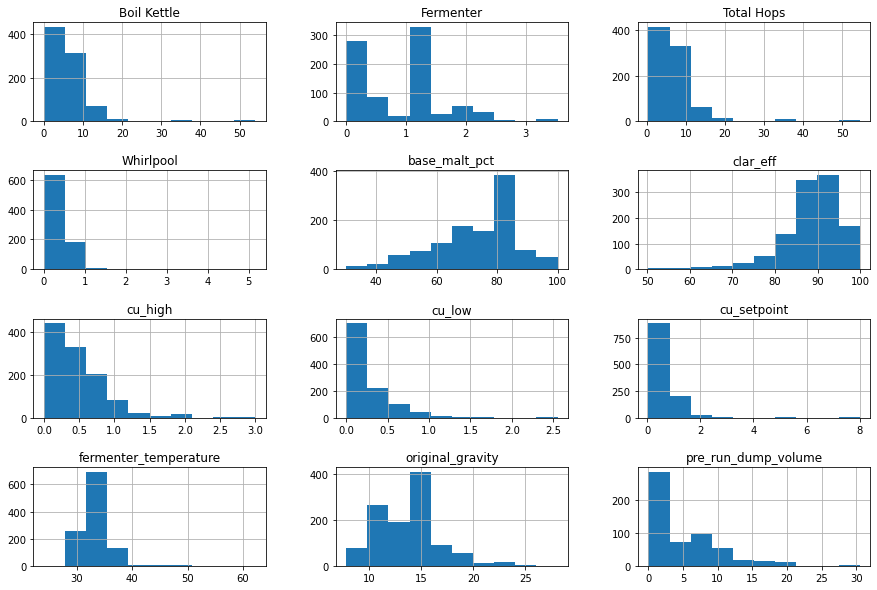

In [185]:
clar_eff_and_malt_and_hops.hist(figsize=(15,10))
plt.subplots_adjust(hspace=0.5)

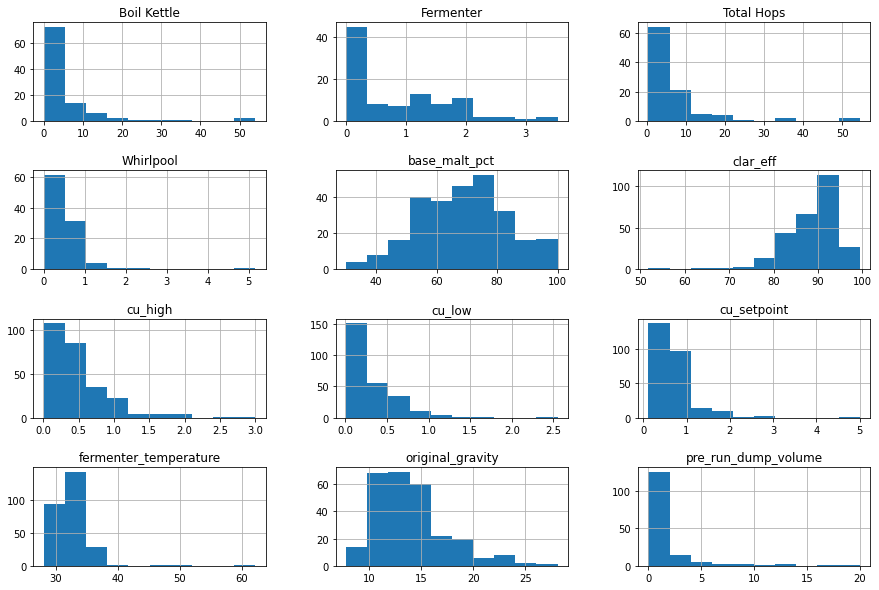

In [186]:
rcp_malt_and_hops_mean_all.hist(figsize=(15,10))
plt.subplots_adjust(hspace=0.5)

## Target Feature

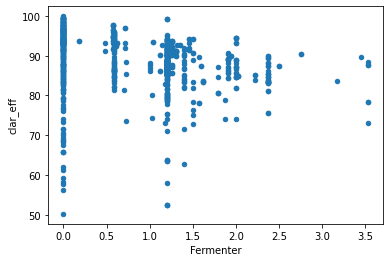

In [248]:
clar_eff_and_malt_and_hops.plot(x='Fermenter', y='clar_eff', kind='scatter');

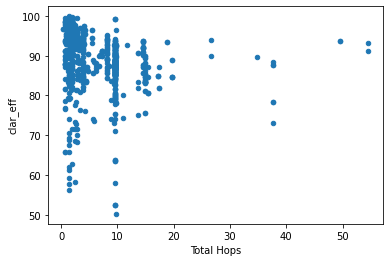

In [246]:
clar_eff_and_malt_and_hops.plot(x='Total Hops', y='clar_eff', kind='scatter');

## 2.13 Summary<a id='2.13_Summary'></a>

**Q: 3** Write a summary statement that highlights the key processes and findings from this notebook. This should include information such as the original number of rows in the data, whether our own resort was actually present etc. What columns, if any, have been removed? Any rows? Summarise the reasons why. Were any other issues found? What remedial actions did you take? State where you are in the project. Can you confirm what the target feature is for your desire to predict ticket price? How many rows were left in the data? Hint: this is a great opportunity to reread your notebook, check all cells have been executed in order and from a "blank slate" (restarting the kernel will do this), and that your workflow makes sense and follows a logical pattern. As you do this you can pull out salient information for inclusion in this summary. Thus, this section will provide an important overview of "what" and "why" without having to dive into the "how" or any unproductive or inconclusive steps along the way.

**A: 3** Key processes in this notebook included: 
1) Identifying areas of missing data

2) Investigating where the resort of interest fits into the overall data

3) Reviewing distributions of columns with histograms to identify anything unusual

Original row count was 330, which was reduced down to 277 primarily due to lack of price data. One row was removed due to the resort being "2019" years old. The fast eights column was removed due to lack of data (and lack of >0 entries where data was present). One entry, Silverton Mountain had unusually enormous skiable terrain, which was assumed to be a typo and was updated from doing a google search. Further, state population and state area were incorporated into the original dataset. A handful of target features, such as skiable terrain and number of runs, have been identified for helping to predict ticket price.